## Setting Up Required Libraries and Environments
This section of the code handles the importation of necessary libraries and the configuration of the environment for image processing and neural network operations.

* #### Environment Configuration:

 `%matplotlib inline`: This command configures the Jupyter Notebook to display matplotlib plots inline, allowing for immediate visualization of plots within the notebook.
* #### Imported Libraries:

1. `PIL.Image` and `io.BytesIO`: These are used for image loading and processing. The PIL (Python Imaging Library) provides capabilities for opening, manipulating, and saving many different image file formats.

2. `matplotlib.pyplot`: A module in matplotlib, it's used for creating static, animated, and interactive visualizations in Python.

3. `numpy`: Imported for its support of large, multi-dimensional arrays and matrices, along with a large collection of high-level mathematical functions to operate on these arrays.

4. `torch` and `torch.optim`: These are PyTorch modules used for building and training neural networks. PyTorch is an open-source machine learning library.

5. `requests`: This module allows you to send HTTP requests using Python, which can be used to fetch content from the web like images.

6. `torchvision.transforms`, `torchvision.models`: Part of the torchvision package, these are used for transforming images and accessing pre-trained models, aiding in tasks like image classification.

In [1]:
# import resources
%matplotlib inline

from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np

import torch
import torch.optim as optim
import requests
from torchvision import transforms, models

## Load in VGG19 (features)

VGG19 is split into two portions:
* `vgg19.features`, segment, consisting of convolutional and pooling layers
* `vgg19.classifier`, segment, made up of three linear layers used for classification

For our purpose, we will utilize only the `features` part of VGG19. We will load this portion and "lock" its weights, ensuring they remain unchanged during our process.


In [2]:
# get the "features" portion of VGG19 (we will not need the "classifier" portion)
vgg = models.vgg19(weights=True).features

# freeze all VGG parameters since we're only optimizing the target image
for param in vgg.parameters():
    param.requires_grad_(False)

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:03<00:00, 183MB/s]  


#### This code segment allocates the `VGG19` model to a GPU for enhanced computation speed, if a GPU is available. If not, it defaults to using the CPU.

In [3]:
# move the model to GPU, if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

vgg.to(device)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

## `load_image()`

#### 1. Function Definition:

* `def load_image(img_path, max_size=400, shape=None):`
* This defines a function `load_image` with parameters for the image path (`img_path`), maximum size (`max_size`), and optional shape (`shape`).

#### 2. Load Image from URL or File System:

* The function checks if the `img_path` is a URL (contains "http"). If it is, it fetches the image from the URL. Otherwise, it loads the image from the local file system.

#### 3. Image Conversion to RGB:

* Regardless of its source, the image is converted to RGB format to ensure consistency, especially if the image has an alpha channel (transparency).

#### 4. Image Resizing for Processing Efficiency:

* To manage computation efficiently, the function checks if the largest dimension of the image exceeds `max_size`. If it does, the image is resized to `max_size`.
* If a specific shape is provided, the image is resized to this shape instead. This is useful for ensuring that the style and content images are of the same size.

#### 5. Image Transformation:

* `in_transform` is a composition of transformations:
* `transforms.Resize(size)`: Resizes the image to the specified size.
* `transforms.ToTensor()`: Converts the image to a PyTorch tensor.
* `transforms.Normalize(...)`: Normalizes the tensor with mean and standard deviation values suitable for pre-trained models.

#### 6. Discarding the Alpha Channel:

* The function removes any alpha channel (`:3`) from the image to ensure it only contains RGB channels.

#### 7. Adding a Batch Dimension:

* `unsqueeze(0)` is used to add a batch dimension to the tensor, making it compatible with the model’s expected input format.

#### 8. Return Preprocessed Image:

* The function returns the transformed and preprocessed image tensor, ready for use in neural network operations.

In [4]:
def load_image(img_path, max_size=400, shape=None):
    
    ''' Load in and transform an image, making sure the image
       is <= 400 pixels in the x-y dims.'''
    
    if "http" in img_path:
        response = requests.get(img_path)
        image = Image.open(BytesIO(response.content)).convert('RGB')
    else:
        image = Image.open(img_path).convert('RGB')
    
    # large images will slow down processing
    if max(image.size) > max_size:
        size = max_size
    else:
        size = max(image.size)
    
    if shape is not None:
        size = shape
        
    in_transform = transforms.Compose([
                        transforms.Resize(size),
                        transforms.ToTensor(),
                        transforms.Normalize((0.485, 0.456, 0.406), 
                                             (0.229, 0.224, 0.225))])

    # discard the transparent, alpha channel (that's the :3) and add the batch dimension
    image = in_transform(image)[:3,:,:].unsqueeze(0)
    
    return image

 #### Next, I'm loading in images by file name and forcing the style image to be the same size as the content image.

In [43]:
# load in content and style image
content = load_image('/kaggle/input/images/octopus.jpg').to(device)
# Resize style to match content, makes code easier
style = load_image('/kaggle/input/images/hockney.jpg', shape=content.shape[-2:]).to(device)

#### Helper function for un-normalizing an image and converting it from a Tensor image to a NumPy image for display

In [30]:
def im_convert(tensor):
    """ Display a tensor as an image. """
    
    image = tensor.to("cpu").clone().detach()
    image = image.numpy().squeeze()
    image = image.transpose(1,2,0)
    image = image * np.array((0.229, 0.224, 0.225)) + np.array((0.485, 0.456, 0.406))
    image = image.clip(0, 1)

    return image

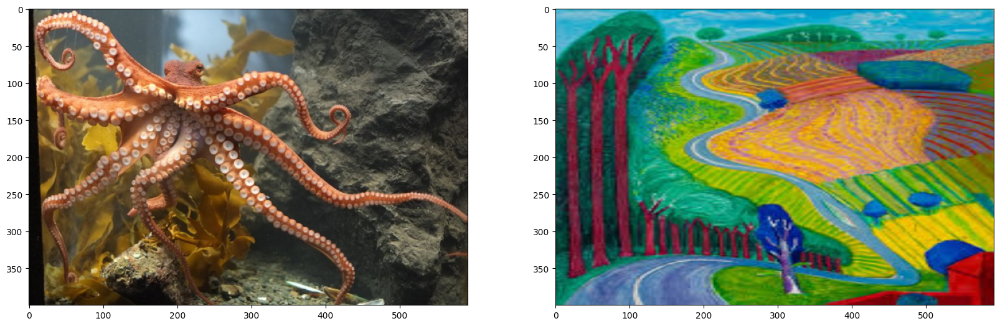

In [44]:
# display the images
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
# content and style ims side-by-side
ax1.imshow(im_convert(content))
ax2.imshow(im_convert(style));

---
## VGG19 Layers

To get the content and style representations of an image, we have to pass an image forward throug the VGG19 network until we get to the desired layer(s) and then get the output from that layer.

In [22]:
# print out VGG19 structure so you can see the names of various layers
print(vgg)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

---
## Content and Style Features

The `get_features` function extracts features from specified layers of a model (such as VGGNet) for a given image. Here's a concise pointwise explanation:

#### 1.  Function Definition:

* `def get_features(image, model, layers=None)`: A function to process an image through a model and extract features from specified layers.

#### 2. Default Layers Setup:

* If no specific layers are provided (`if layers is None`), the function defaults to a pre-defined set of layers. These layers (`'0': 'conv1_1', '5': 'conv2_1'`, etc.) are typically used in style transfer, following Gatys et al. (2016).

#### 3. Feature Extraction:

* The function iterates through each module (layer) in the model (`for name, layer in model._modules.items()`).
* It processes the image through each layer (`x = layer(x)`).

#### 4. Layer Selection:

* If the current layer is one of the specified layers for feature extraction (`if name in layers`), its output is stored in the `features` dictionary.

#### 5. Return Features:

* The function returns a dictionary (`features`) where keys are the names of the layers and values are the corresponding extracted features from those layers.



In [23]:
def get_features(image, model, layers=None):
    """ Run an image forward through a model and get the features for 
        a set of layers. Default layers are for VGGNet matching Gatys et al (2016)
    """
    
    ## Need the layers for the content and style representations of an image
    if layers is None:
        layers = {'0': 'conv1_1',
                  '5': 'conv2_1', 
                  '10': 'conv3_1', 
                  '19': 'conv4_1',
                  '21': 'conv4_2',  ## content representation
                  '28': 'conv5_1'}
        
    features = {}
    x = image
    # model._modules is a dictionary holding each module in the model
    for name, layer in model._modules.items():
        x = layer(x)
        if name in layers:
            features[layers[name]] = x
            
    return features

---
## Gram Matrix 

The output of every convolutional layer is a Tensor with dimensions associated with the `batch_size`, a depth, `d` and some height and width (`h`, `w`). The Gram matrix of a convolutional layer can be calculated as follows:
* Get the depth, height, and width of a tensor using `batch_size, d, h, w = tensor.size`
* Reshape that tensor so that the spatial dimensions are flattened
* Calculate the gram matrix by multiplying the reshaped tensor by it's transpose 

In [24]:
def gram_matrix(tensor):
    
    """ Calculate the Gram Matrix of a given tensor 
        Gram Matrix: https://en.wikipedia.org/wiki/Gramian_matrix
    """
    
    # get the batch_size, depth, height, and width of the Tensor
    b, d, h, w = tensor.size()
    
    # reshape so we're multiplying the features for each channel
    tensor = tensor.view(b * d, h * w)
    
    # calculate the gram matrix
    gram = torch.mm(tensor, tensor.t())
    
    return gram 

## Putting it all Together

Now that we've written functions for extracting features and computing the gram matrix of a given convolutional layer; let's put all these pieces together! We'll extract our features from our images and calculate the gram matrices for each layer in our style representation.

In [45]:
# get content and style features only once before training
content_features = get_features(content, vgg)
style_features = get_features(style, vgg)

# calculate the gram matrices for each layer of our style representation
style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

# create a third "stylized_image" image and prep it for change
# it is a good idea to start off with the target as a copy of our *content* image
# then iteratively change its style
stylized_image = content.clone().requires_grad_(True).to(device)

This section of code defines the weights assigned to different layers in the style transfer process:

#### 1. Style Layer Weights (`style_weights`):

* A dictionary that assigns weights to specific layers of the VGG model used for capturing the style of an image.
* Weights are assigned to layers `conv1_1`, `conv2_1`, `conv3_1`, `conv4_1`, and `conv5_1`.
* Earlier layers (like `conv1_1`) are given higher weights to emphasize larger style features in the generated image.
* Layers like `conv4_2` are excluded as they are used for content representation, not style.

#### 2. Content Weight (`content_weight`):

* Denoted as `alpha`, this is a scalar weight for the content loss in the style transfer process.
* Set to `1`, indicating the base level of importance for content preservation.

#### 3. Style Weight (`style_weight`):

* Denoted as `beta`, this is a scalar weight for the style loss.
* Set to `1e6` (1 million), signifying a much higher emphasis on style representation compared to content.


These weights are crucial for balancing the contribution of content and style in the final stylized image. The significant difference between `content_weight` and `style_weight` indicates a strong preference for capturing the style details in this setup.

In [40]:
# weights for each style layer 
# weighting earlier layers more will result in *larger* style artifacts

style_weights = {'conv1_1': 1.,
                 'conv2_1': 0.75,
                 'conv3_1': 0.2,
                 'conv4_1': 0.2,
                 'conv5_1': 0.2}

content_weight = 1  # alpha
style_weight = 1e6  # beta

## Updating the Target & Calculating Losses

Now we'll decide on a number of steps for which to update your image, this is similar to the training loop, only we are changing our _target_ image and nothing else about VGG19 or any other image. Therefore, the number of steps is really up to us to set! **Let's use at least 2000 steps for good results.** But, we may want to start out with fewer steps if we are just testing out different weight values or experimenting with different images.

Inside the iteration loop, we'll calculate the content and style losses and update your target image, accordingly.

#### Content Loss

The content loss will be the mean squared difference between the target and content features at layer `conv4_2`. This can be calculated as follows: 
```
content_loss = torch.mean((target_features['conv4_2'] - content_features['conv4_2'])**2)
```

#### Style Loss

The style loss is calculated in a similar way, only we have to iterate through a number of layers, specified by name in our dictionary `style_weights`. 
> We'll calculate the gram matrix for the target image, `target_gram` and style image `style_gram` at each of these layers and compare those gram matrices, calculating the `layer_style_loss`. 
> Later, we'll see that this value is normalized by the size of the layer.

#### Total Loss

Finally, we'll create the total loss by adding up the style and content losses and weighting them with your specified alpha and beta!

Intermittently, we'll print out this loss.

Total loss:  396259648.0


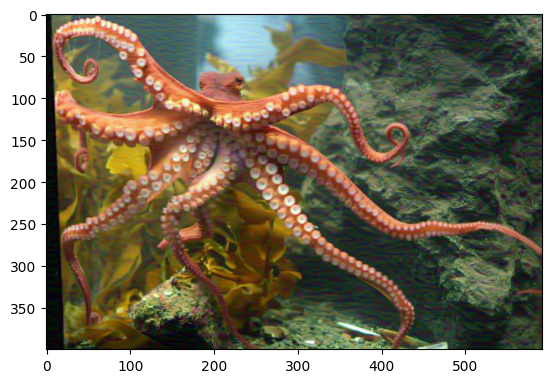

Total loss:  245285696.0


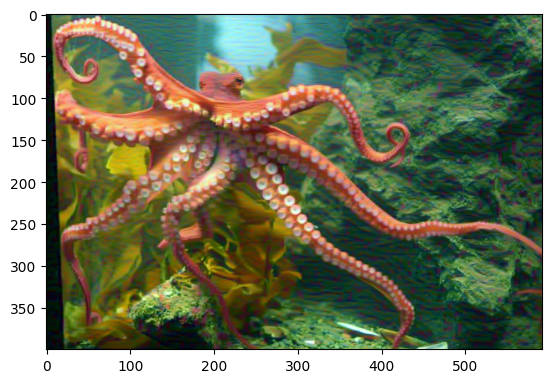

Total loss:  116784000.0


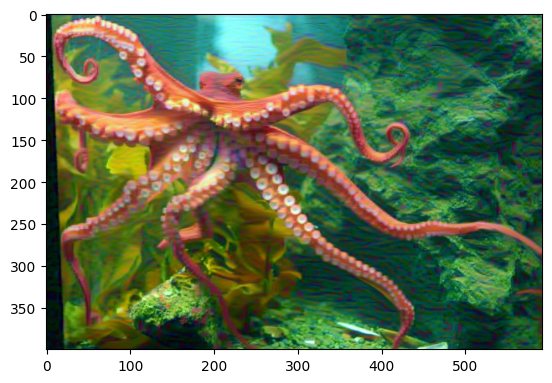

Total loss:  50914936.0


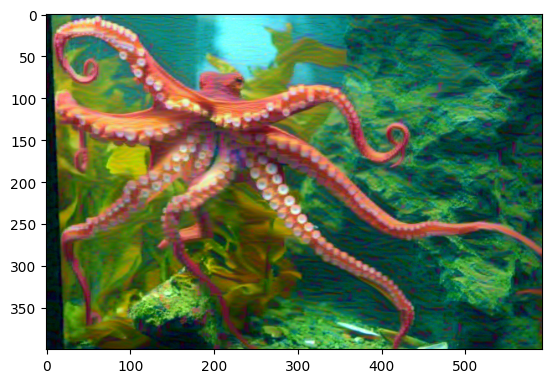

Total loss:  26247776.0


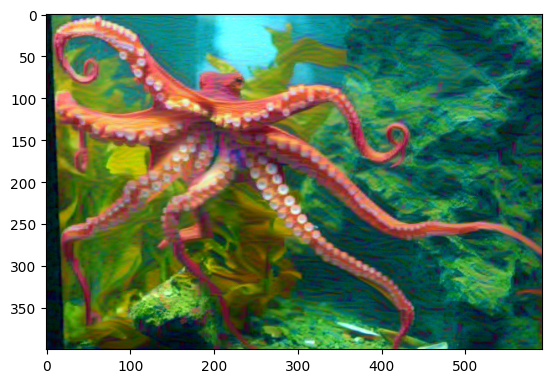

Total loss:  16966638.0


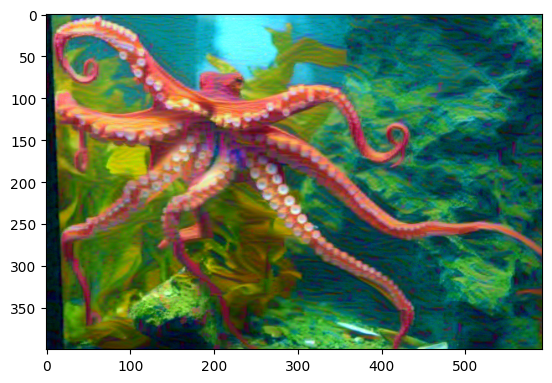

Total loss:  12654081.0


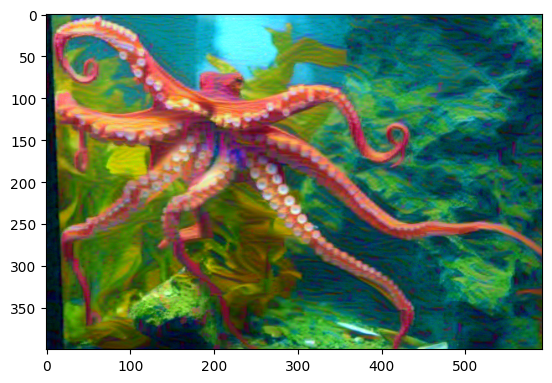

Total loss:  10049076.0


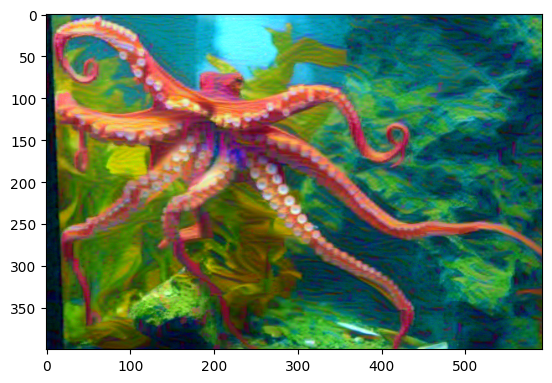

Total loss:  8266284.5


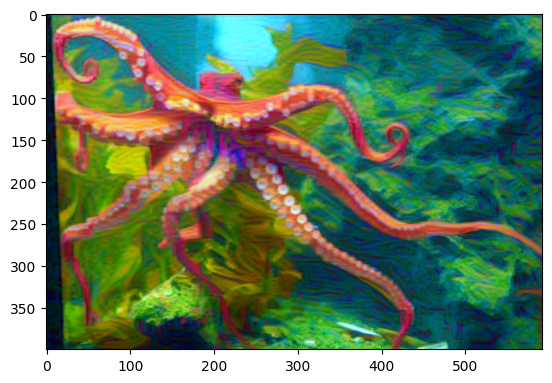

Total loss:  6971107.5


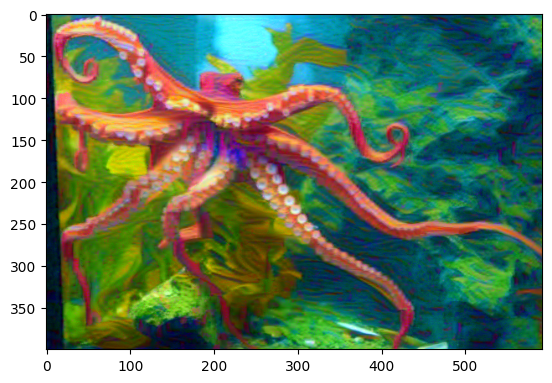

Total loss:  5985380.5


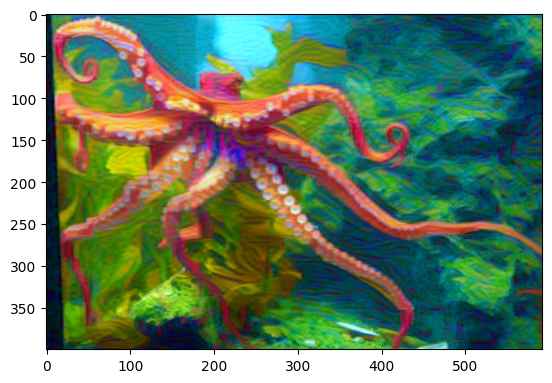

Total loss:  5202171.0


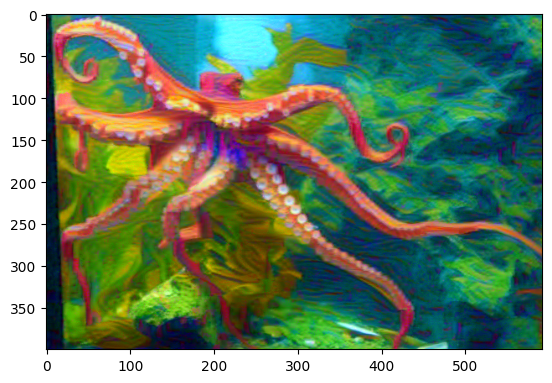

Total loss:  4557674.0


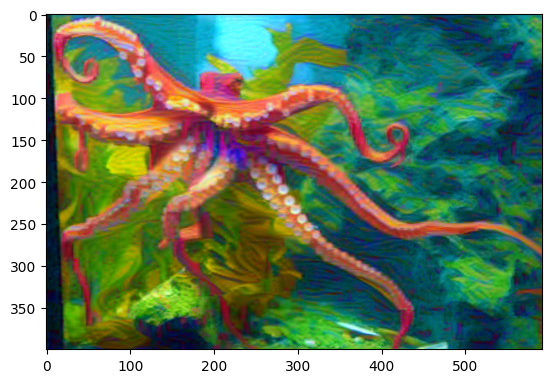

Total loss:  4015626.25


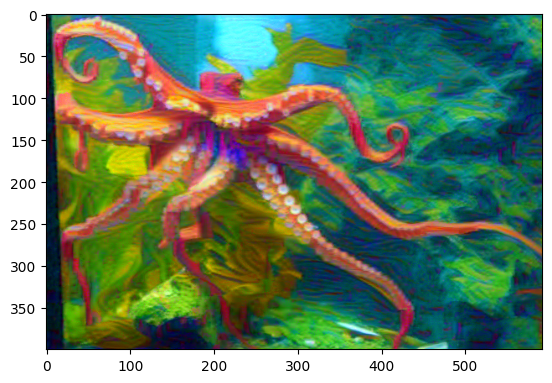

Total loss:  3553944.75


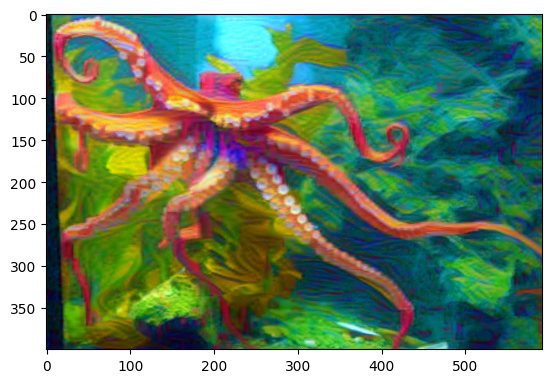

Total loss:  3157070.25


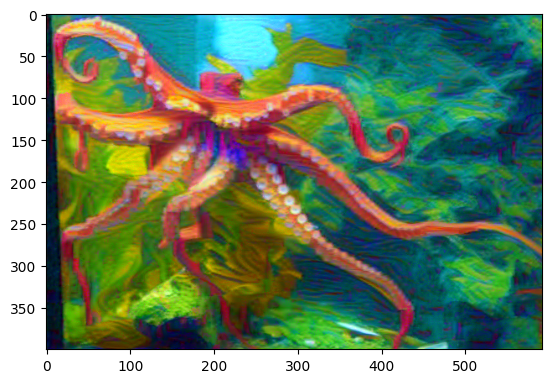

Total loss:  2813816.5


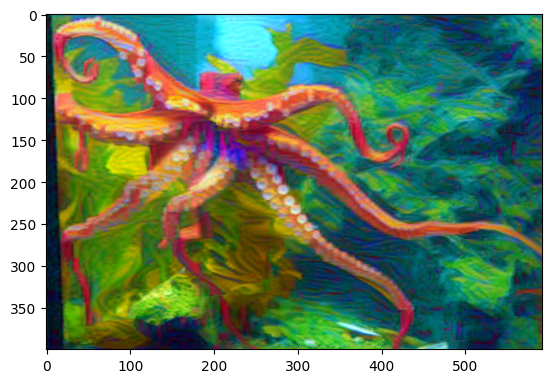

Total loss:  2516172.25


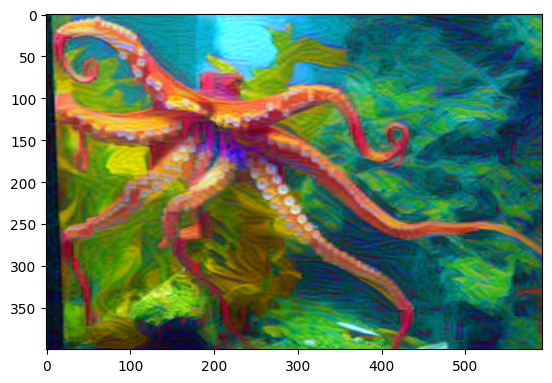

Total loss:  2256916.0


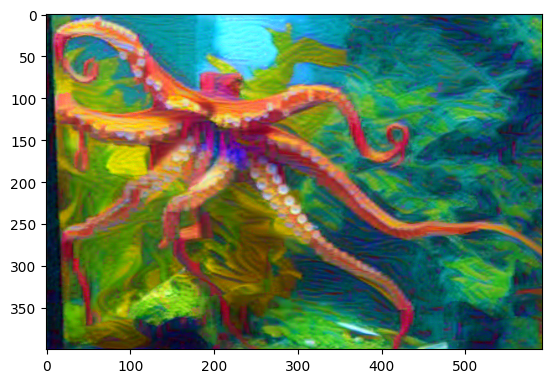

Total loss:  2030365.75


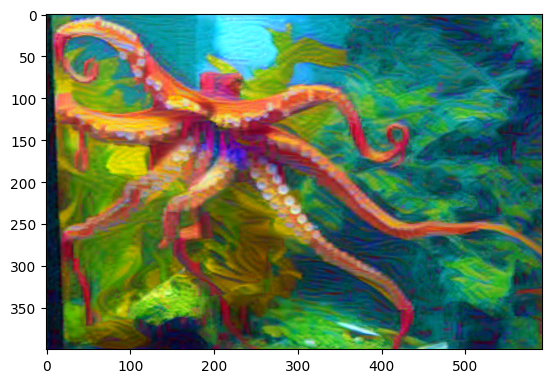

In [46]:
# for displaying the target image, intermittently
show_every = 100

# iteration hyperparameters
optimizer = optim.Adam([stylized_image], lr=0.003)
steps = 2000  # decide how many iterations to update your image (5000)


for ii in range(1, steps+1):
    
    # get the features from your target image
    target_features = get_features(stylized_image, vgg)
    
    # the content loss
    content_loss = torch.mean((target_features['conv4_2'] - content_features['conv4_2'])**2)
    
    
    # the style loss
    # initialize the style loss to 0
    style_loss = 0
    # then add to it for each layer's gram matrix loss
    for layer in style_weights:
        # get the "target" style representation for the layer
        target_feature = target_features[layer]
        target_gram = gram_matrix(target_feature)
        _, d, h, w = target_feature.shape
        # get the "style" style representation
        style_gram = style_grams[layer]
        # the style loss for one layer, weighted appropriately
        layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
        # add to the style loss
        style_loss += layer_style_loss / (d * h * w)
        
    # calculate the *total* loss
    total_loss = content_weight * content_loss + style_weight * style_loss
    
    # update your target image
    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()
    
    # display intermediate images and print the loss
    if  ii % show_every == 0:
        print('Total loss: ', total_loss.item())
        plt.imshow(im_convert(stylized_image))
        plt.show()

## Display the Target Image

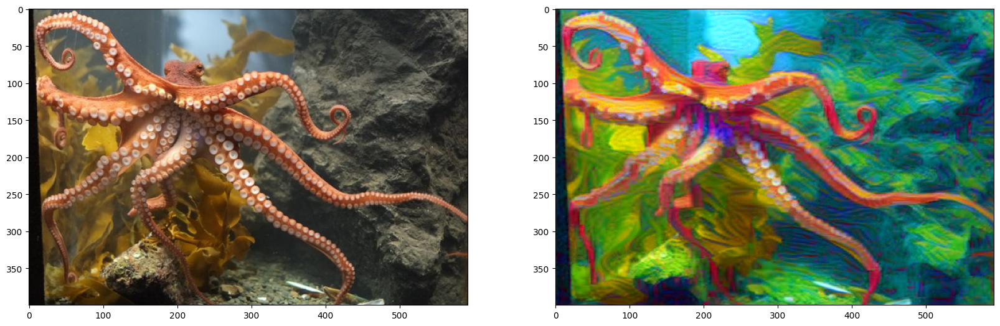

In [47]:
# display content and final, target image
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(im_convert(content))
ax2.imshow(im_convert(stylized_image));